In [1]:
folder_path = "/kaggle/input/flickr8k"

# Import neccessary libraries

In [2]:
import numpy as np
import pandas as pd
import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim

import torchvision.models as models
from torchvision.datasets import Flickr8k

In [3]:
import os
from collections import Counter
import spacy
import torch
from torch.nn.utils.rnn import pad_sequence
from torch.utils.data import DataLoader,Dataset
import torchvision.transforms as T

from PIL import Image

In [4]:
from spacy.lang.en import English
nlp = English()

tokenizer = nlp.tokenizer

In [5]:
caption_file = folder_path + "/captions.txt"

df = pd.read_csv(caption_file)
df.head(10)

,image,caption
0,1000268201_693b08cb0e.jpg,A child in a pink dress is climbing up a set o...
1,1000268201_693b08cb0e.jpg,A girl going into a wooden building .
2,1000268201_693b08cb0e.jpg,A little girl climbing into a wooden playhouse .
3,1000268201_693b08cb0e.jpg,A little girl climbing the stairs to her playh...
4,1000268201_693b08cb0e.jpg,A little girl in a pink dress going into a woo...
5,1001773457_577c3a7d70.jpg,A black dog and a spotted dog are fighting
6,1001773457_577c3a7d70.jpg,A black dog and a tri-colored dog playing with...
7,1001773457_577c3a7d70.jpg,A black dog and a white dog with brown spots a...
8,1001773457_577c3a7d70.jpg,Two dogs of different breeds looking at each o...
9,1001773457_577c3a7d70.jpg,Two dogs on pavement moving toward each other .


# Visualizing 1 data point in dataset

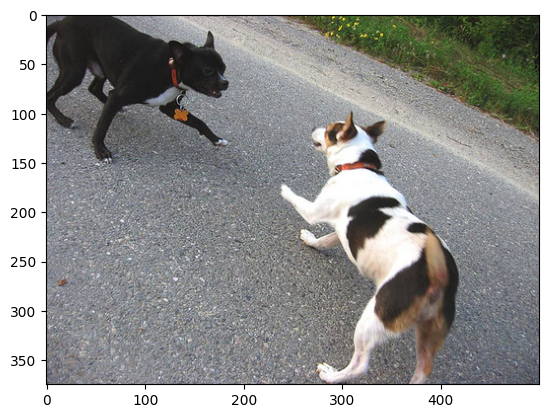

Caption: A black dog and a spotted dog are fighting
Caption: A black dog and a tri-colored dog playing with each other on the road .
Caption: A black dog and a white dog with brown spots are staring at each other in the street .
Caption: Two dogs of different breeds looking at each other on the road .
Caption: Two dogs on pavement moving toward each other .


In [6]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

data_idx = 5

image_path = folder_path + "/Images/" + df.iloc[data_idx, 0]
img = mpimg.imread(image_path)
plt.imshow(img)
plt.show()

for i in range(data_idx, data_idx + 5):
    print("Caption:", df.iloc[i, 1])

# Create Vocabulary 

In [7]:
class Vocabulary:
    def __init__(self, freq_threshold):
        # setting the pre-served tokens int to string tokens
        self.itos = {0: "<PAD>", 1: "<SOS>", 2: "<EOS>", 3: "<UNK>"}

        # string to int tokens
        self.stoi = {v:k for k, v in self.itos.items()}
        self.freq_threshold = freq_threshold

    def __len__(self): return len(self.itos)

    @staticmethod
    def tokenize(text):
        return [token.text.lower() for token in tokenizer(text)]

    def build_vocab(self, sentence_list):
        frequencies = Counter()
        idx = 4

        for sentence in sentence_list:
            for word in self.tokenize(sentence):
                frequencies[word] += 1

                if frequencies[word] == self.freq_threshold:
                    self.stoi[word] = idx
                    self.itos[idx] = word
                    idx += 1

    def numericalize(self, text):
        tokenized_text = self.tokenize(text)
        return [self.stoi[token]  \
                if token in self.stoi \
                else self.stoi["<UNK>"] \
                for token in tokenized_text]

# Custom Dataset

In [8]:
class FlickrDataset(Dataset):
    def __init__(self, root_dir, captions_file, transform=None, freq_threshold=5):
        self.root_dir = root_dir
        self.df = pd.read_csv(captions_file)
        self.transform = transform

        self.imgs = self.df["image"]
        self.captions = self.df["caption"]

        self.vocab = Vocabulary(freq_threshold)
        self.vocab.build_vocab(self.captions.tolist())

    def __len__(self):
        return len(self.df)
    def __getitem__(self, idx):
        caption = self.captions[idx]
        img_name = self.imgs[idx]
        img_location = os.path.join(self.root_dir, img_name)
        img = Image.open(img_location).convert("RGB")

        if self.transform is not None:
            img = self.transform(img)
        # numericalize the caption text
        caption_vec = []
        caption_vec += [self.vocab.stoi["<SOS>"]]
        caption_vec += self.vocab.numericalize(caption)
        caption_vec += [self.vocab.stoi["<EOS>"]]

        return img, torch.tensor(caption_vec)

In [9]:
transforms = T.Compose([
    T.Resize(226),
    T.RandomCrop(224),
    T.ToTensor(),
    T.Normalize((0.485, 0.456, 0.406),(0.229, 0.224, 0.225))
])

In [10]:
dataset = FlickrDataset(
    root_dir = folder_path + "/Images",
    captions_file = folder_path + "/captions.txt",
    transform = transforms
)

In [11]:
test_set = []
for i in range(1, 76, 5):
    test_set.append(dataset[len(dataset) - i])
    
test_set = tuple(test_set)

In [12]:
def show_image(img, title=None):
    """Imshow for Tensor."""
    
    #unnormalize 
    img[0] = img[0] * 0.229
    img[1] = img[1] * 0.224 
    img[2] = img[2] * 0.225 
    img[0] += 0.485 
    img[1] += 0.456 
    img[2] += 0.406
    
    img = img.numpy().transpose((1, 2, 0))
    
    
    plt.imshow(img)
    if title is not None:
        plt.title(title)
    plt.pause(0.001)  # pause a bit so that plots are updated

# Visualizing one image in custom dataset

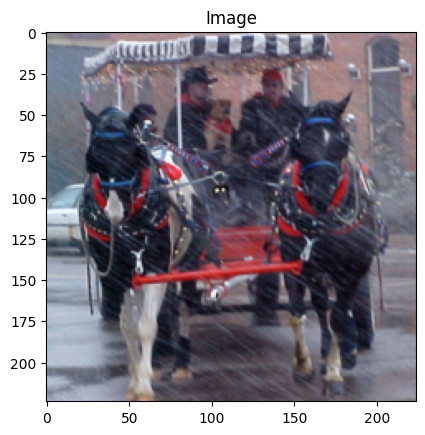

Token: tensor([  1,  10, 146, 355,  10, 477,  45, 103,  68,  16,   4,   6,  45,  37,
         10, 928,   5,   2])
Sentence:
['<SOS>', 'the', 'horses', 'pull', 'the', 'carriage', ',', 'holding', 'people', 'and', 'a', 'dog', ',', 'through', 'the', 'rain', '.', '<EOS>']


In [13]:
img, caps = test_set[14]
show_image(img,"Image")
print("Token:",caps)
print("Sentence:")
print([dataset.vocab.itos[token] for token in caps.tolist()])

In [14]:
class CapsCollate:
    def __init__(self, pad_idx, batch_first=False):
        self.pad_idx = pad_idx
        self.batch_first = batch_first

    def __call__(self, batch):
        imgs = [item[0].unsqueeze(0) for item in batch]
        imgs = torch.cat(imgs, dim=0)

        targets = [item[1] for item in batch]
        targets = pad_sequence(targets,
                               batch_first=self.batch_first,
                               padding_value=self.pad_idx)

        return imgs, targets

# Load data through DataLoader

In [15]:
#writing the dataloader
#setting the constants
BATCH_SIZE = 64
NUM_WORKER = 1

#token to represent the padding
pad_idx = dataset.vocab.stoi["<PAD>"]

data_loader = DataLoader(
    dataset=dataset,
    batch_size=BATCH_SIZE,
    num_workers=NUM_WORKER,
    shuffle=True,
    collate_fn=CapsCollate(pad_idx=pad_idx,batch_first=True)
)

test_loader = DataLoader(
    dataset=test_set,
    batch_size=1,
    num_workers=NUM_WORKER,
    shuffle=False,
    collate_fn=CapsCollate(pad_idx=pad_idx,batch_first=True)
)

vocab_size = len(dataset.vocab)
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
device

device(type='cuda', index=0)

In [ ]:
#generating the iterator from the dataloader
dataiter = iter(test_loader)

#getting the next batch
batch = next(dataiter)

#unpacking the batch
images, captions = batch

#showing info of image in single batch
for i in range(1):
    img, cap = batch
    caption_label = [dataset.vocab.itos[token] for token in cap[0].tolist()]
    eos_index = caption_label.index('<EOS>')
    caption_label = caption_label[1:eos_index]
    caption_label = ' '.join(caption_label)
    show_image(img[0],caption_label)
    plt.show()

# Definition Model

In [16]:
class EncoderCNN(nn.Module):
    def __init__(self, embed_dim):
        super(EncoderCNN, self).__init__()
        resnet = models.resnet50(pretrained=True)
        for param in resnet.parameters():
            param.requires_grad_(False)
        modules = list(resnet.children())[:-1]
        self.resnet = nn.Sequential(*modules)
        self.embed = nn.Linear(resnet.fc.in_features, embed_dim)

    def forward(self, images):
        features = self.resnet(images)
        features = features.view(features.size(0), -1)
        features = self.embed(features)

        return features

In [17]:
class Decoder(nn.Module):
    def __init__(self, embed_dim, hidden_dim, vocab_size, num_layers=2, drop_prob=0.3):
        super().__init__()
        self.embedding = nn.Embedding(vocab_size, embed_dim)
        self.lstm = nn.LSTM(embed_dim, hidden_dim, num_layers=num_layers, batch_first=True)
        self.fc = nn.Linear(hidden_dim, vocab_size)
        self.drop = nn.Dropout(drop_prob)
    def forward(self, features, captions):
        embeds = self.embedding(captions[:, :-1])

        x = torch.cat((features.unsqueeze(1), embeds), dim=1)
        x, _ = self.lstm(x)
        x = self.fc(x)
        return x
    def generate_caption(self, inputs, hidden=None, max_len=20, vocab=None):
        batch_size = inputs.size(0)

        captions = []

        for i in range(max_len):
            output, hidden = self.lstm(inputs, hidden)
            output = self.fc(output)
            output = output.view(batch_size, -1)

            predicted_word_idx = output.argmax(dim=1)
            captions.append(predicted_word_idx.item())

            if vocab.itos[predicted_word_idx.item()] == "<EOS>":
                break
            inputs = self.embedding(predicted_word_idx.unsqueeze(0))
        return [vocab.itos[idx] for idx in captions]


In [18]:
class EncoderDecoder(nn.Module):
    def __init__(self, embed_dim, hidden_dim, vocab_size, num_layers=1, drop_prob=0.3):
        super().__init__()
        self.encoder = EncoderCNN(embed_dim)
        self.decoder = Decoder(embed_dim, hidden_dim, vocab_size, num_layers, drop_prob)
    def forward(self, images, captions):
        features = self.encoder(images)
        outputs = self.decoder(features, captions)
        return outputs

In [19]:
# Hyperparamets
embed_dim = 300
hidden_dim = 512
vocab_size = len(dataset.vocab)
num_layers = 1
learning_rate = 0.01

In [20]:
model = EncoderDecoder(embed_dim, hidden_dim, vocab_size, num_layers).to(device)

/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 146MB/s] 


In [21]:
criterion = nn.CrossEntropyLoss(ignore_index=dataset.vocab.stoi["<PAD>"])
optimizer = optim.AdamW(model.parameters(), lr=learning_rate)

# Training and Evaluate Model

Epoch: 1 loss: 2.38809


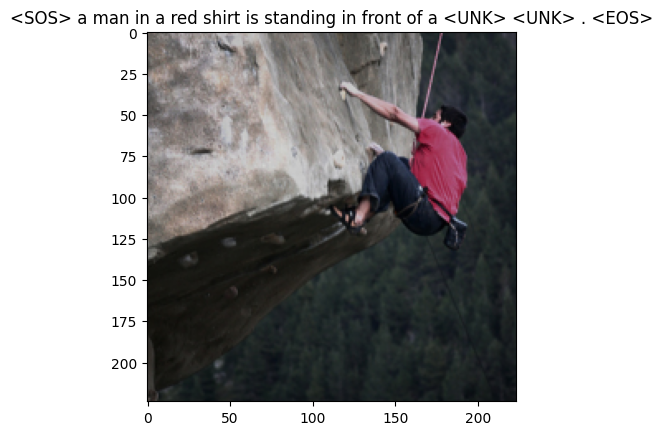

Label caption: a rock climber practices on a rock climbing wall .
Epoch: 2 loss: 2.31966


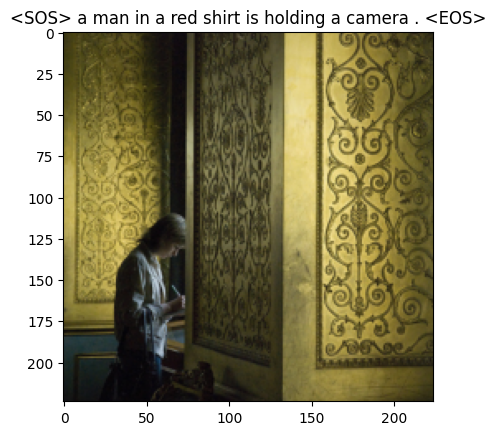

Label caption: woman writing on a pad in room with gold , decorated walls .
Epoch: 3 loss: 2.26382


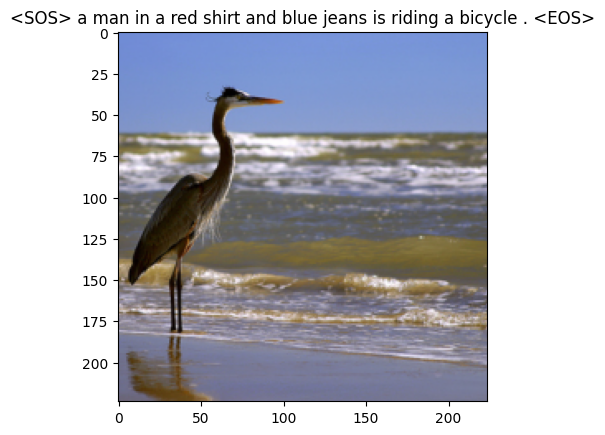

Label caption: a white crane stands tall as it looks out upon the ocean .
Epoch: 4 loss: 2.21981


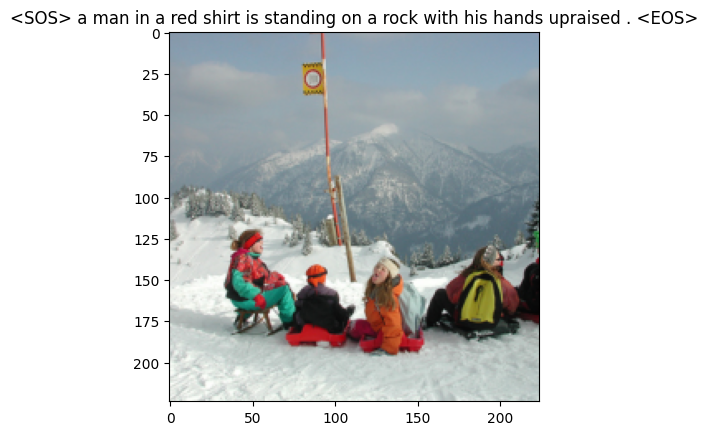

Label caption: five people are sitting together in the snow .
Epoch: 5 loss: 2.18000


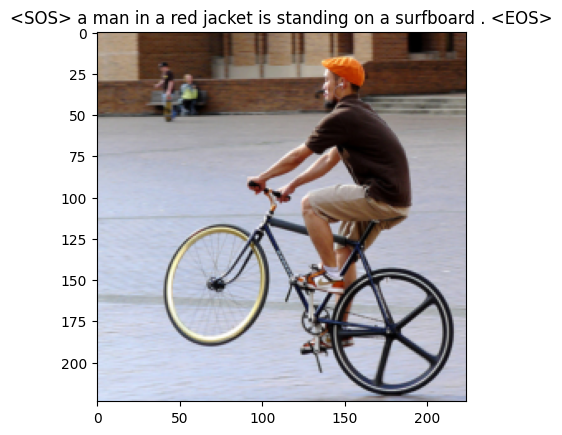

Label caption: man on a bicycle riding on only one wheel .
Epoch: 6 loss: 2.14785


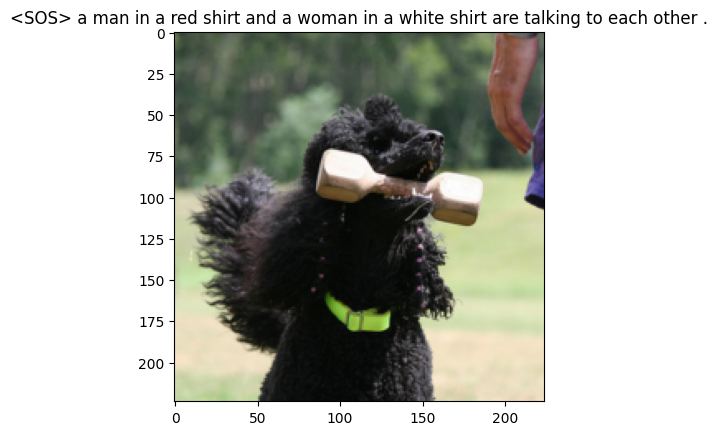

Label caption: the black dog has a toy in its mouth and a person stands nearby .
Epoch: 7 loss: 2.11818


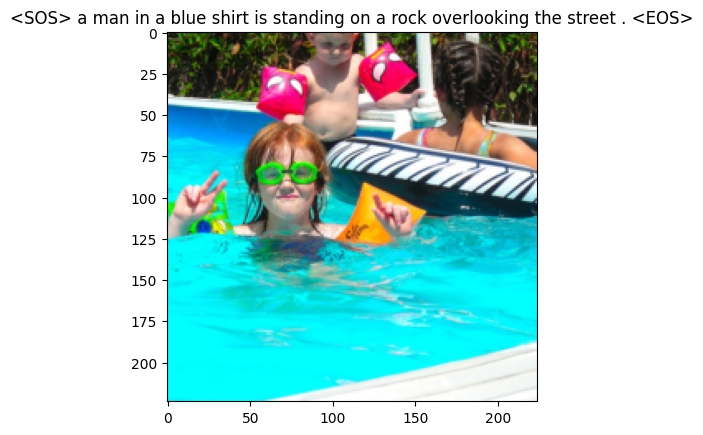

Label caption: a young girl with goggles and floaties poses for the camera as she plays in a pool .
Epoch: 8 loss: 2.08863


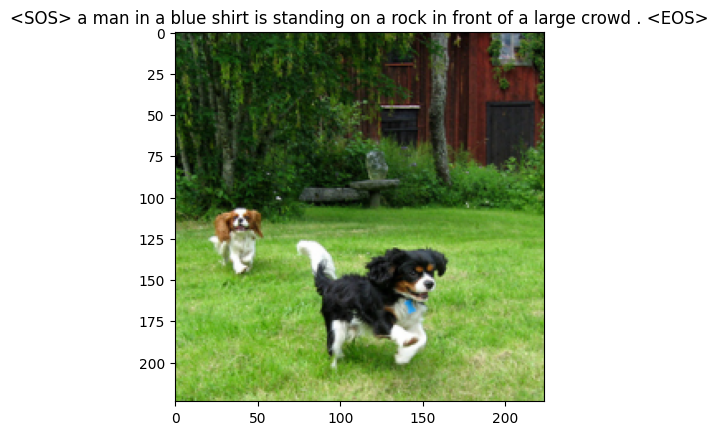

Label caption: two dogs are running through the grass near a house and trees .
Epoch: 9 loss: 2.06804


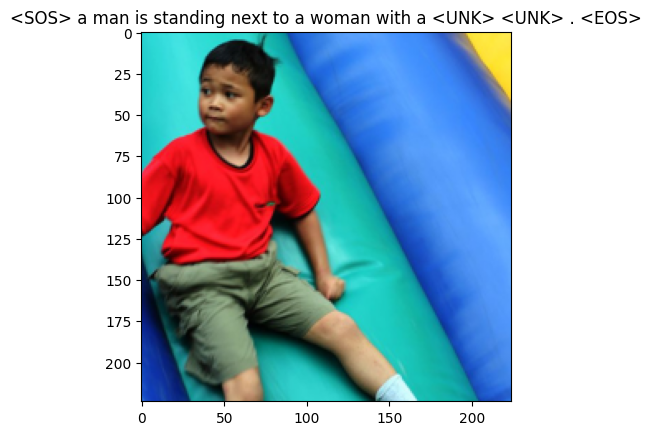

Label caption: a young boy sliding down an inflatable , is looking off camera .
Epoch: 10 loss: 2.04207


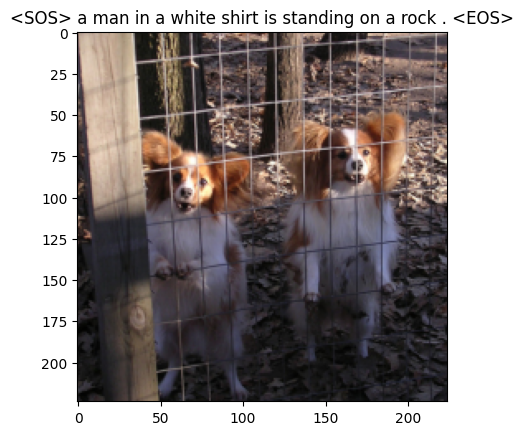

Label caption: two white and brown dogs up against a fence .
Epoch: 11 loss: 2.02684


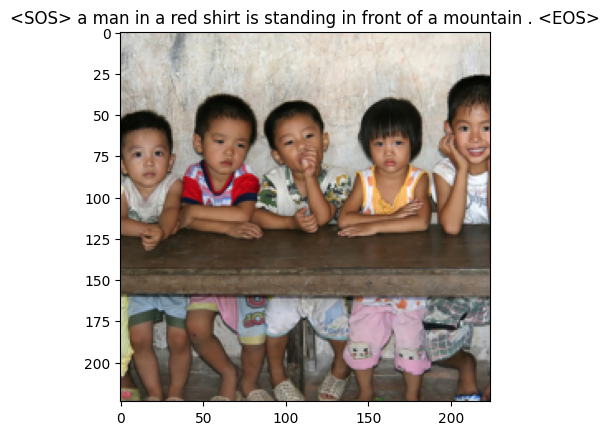

Label caption: six small children sitting at a desk .
Epoch: 12 loss: 2.00360


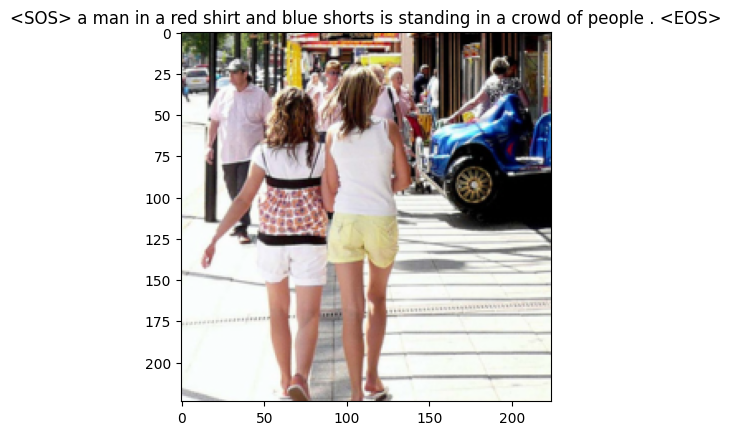

Label caption: two women walk on the sidewalk .
Epoch: 13 loss: 1.99101


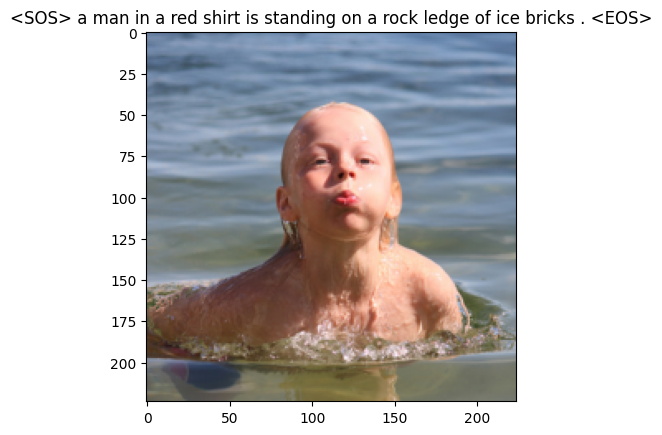

Label caption: the small child comes up from underwater .
Epoch: 14 loss: 1.97788


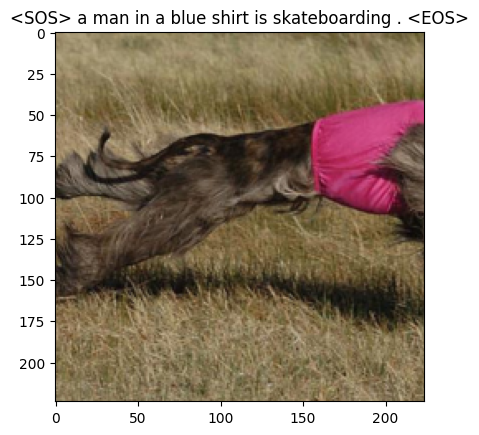

Label caption: dog with pink jacket running in field
Epoch: 15 loss: 1.96310


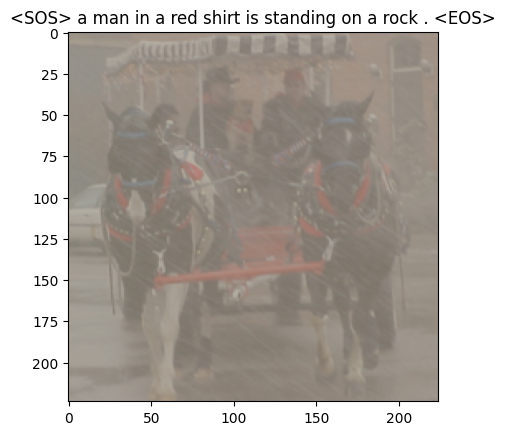

Label caption: the horses pull the carriage , holding people and a dog , through the rain .


In [39]:
num_epochs = 15
print_every = 100

test_iter = iter(test_loader)

for epoch in range(1, num_epochs+1):
    model.train()
    total_loss = 0
    for idx, (image, captions) in enumerate(iter(data_loader)):
        image, captions = image.to(device), captions.to(device)

        optimizer.zero_grad()
        outputs = model(image, captions)

        loss = criterion(outputs.view(-1, vocab_size), captions.view(-1))

        loss.backward()

        optimizer.step()
        
        total_loss += loss.item()

    print("Epoch: {} loss: {:.5f}".format(epoch, total_loss / len(data_loader)))
    model.eval()
    with torch.no_grad():
        img, label_cap = next(test_iter)
        features = model.encoder(img[0:1].to(device))

        caps = model.decoder.generate_caption(features.unsqueeze(0), vocab=dataset.vocab)
        caption = ' '.join(caps)
        show_image(img[0], title=caption)
        
        caption_label = [dataset.vocab.itos[token] for token in label_cap[0].tolist()]
        eos_index = caption_label.index('<EOS>')
        caption_label = caption_label[1:eos_index]
        caption_label = ' '.join(caption_label)
        print("Label caption:", caption_label)


In [ ]:
checkpoint = {'model': model,
              'state_dict': model.state_dict(),
              'optimizer' : optimizer.state_dict()}

torch.save(checkpoint, 'checkpoint.pth')

# Image Captioning with Attention

In [40]:
class EncoderCNN(nn.Module):
    def __init__(self):
        super(EncoderCNN, self).__init__()
        resnet = models.resnet50(pretrained=True)
        for param in resnet.parameters():
            param.requires_grad_(False)
        modules = list(resnet.children())[:-1]
        self.resnet = nn.Sequential(*modules)

    def forward(self, images):
        features = self.resnet(images)
        features = features.permute(0, 2, 3, 1)
        features = features.view(features.size(0), -1, features.size(-1))

        return features

In [41]:
#Bahdanau Attention
class Attention(nn.Module):
    def __init__(self, encoder_dim,decoder_dim,attention_dim):
        super(Attention, self).__init__()
        
        self.attention_dim = attention_dim
        
        self.W = nn.Linear(decoder_dim,attention_dim)
        self.U = nn.Linear(encoder_dim,attention_dim)
        
        self.A = nn.Linear(attention_dim,1)
        
        
        
        
    def forward(self, features, hidden_state):
        u_hs = self.U(features)     #(batch_size,num_layers,attention_dim)
        w_ah = self.W(hidden_state) #(batch_size,attention_dim)
        
        combined_states = torch.tanh(u_hs + w_ah.unsqueeze(1)) #(batch_size,num_layers,attemtion_dim)
        
        attention_scores = self.A(combined_states)         #(batch_size,num_layers,1)
        attention_scores = attention_scores.squeeze(2)     #(batch_size,num_layers)
        
        
        alpha = F.softmax(attention_scores,dim=1)          #(batch_size,num_layers)
        
        attention_weights = features * alpha.unsqueeze(2)  #(batch_size,num_layers,features_dim)
        attention_weights = attention_weights.sum(dim=1)   #(batch_size,num_layers)
        
        return alpha,attention_weights
        

In [42]:
#Attention Decoder
class DecoderRNN(nn.Module):
    def __init__(self,embed_size, vocab_size, attention_dim,encoder_dim,decoder_dim,drop_prob=0.3):
        super().__init__()
        
        #save the model param
        self.vocab_size = vocab_size
        self.attention_dim = attention_dim
        self.decoder_dim = decoder_dim
        
        self.embedding = nn.Embedding(vocab_size,embed_size)
        self.attention = Attention(encoder_dim,decoder_dim,attention_dim)
        
        
        self.init_h = nn.Linear(encoder_dim, decoder_dim)  
        self.init_c = nn.Linear(encoder_dim, decoder_dim)  
        self.lstm_cell = nn.LSTMCell(embed_size+encoder_dim,decoder_dim,bias=True)
        self.f_beta = nn.Linear(decoder_dim, encoder_dim)
        
        
        self.fcn = nn.Linear(decoder_dim,vocab_size)
        self.drop = nn.Dropout(drop_prob)
        
        
    
    def forward(self, features, captions):
        
        #vectorize the caption
        embeds = self.embedding(captions)
        
        # Initialize LSTM state
        h, c = self.init_hidden_state(features)  # (batch_size, decoder_dim)
        
        #get the seq length to iterate
        seq_length = len(captions[0])-1 #Exclude the last one
        batch_size = captions.size(0)
        num_features = features.size(1)
        
        preds = torch.zeros(batch_size, seq_length, self.vocab_size).to(device)
        alphas = torch.zeros(batch_size, seq_length,num_features).to(device)
                
        for s in range(seq_length):
            alpha,context = self.attention(features, h)
            lstm_input = torch.cat((embeds[:, s], context), dim=1)
            h, c = self.lstm_cell(lstm_input, (h, c))
                    
            output = self.fcn(self.drop(h))
            
            preds[:,s] = output
            alphas[:,s] = alpha  
        
        
        return preds, alphas
    
    def generate_caption(self,features,max_len=20,vocab=None):
        # Inference part
        # Given the image features generate the captions
        
        batch_size = features.size(0)
        h, c = self.init_hidden_state(features)  # (batch_size, decoder_dim)
        
        alphas = []
        
        #starting input
        word = torch.tensor(vocab.stoi['<SOS>']).view(1,-1).to(device)
        embeds = self.embedding(word)

        
        captions = []
        
        for i in range(max_len):
            alpha,context = self.attention(features, h)
            
            
            #store the apla score
            alphas.append(alpha.cpu().detach().numpy())
            
            lstm_input = torch.cat((embeds[:, 0], context), dim=1)
            h, c = self.lstm_cell(lstm_input, (h, c))
            output = self.fcn(self.drop(h))
            output = output.view(batch_size,-1)
        
            
            #select the word with most val
            predicted_word_idx = output.argmax(dim=1)
            
            #save the generated word
            captions.append(predicted_word_idx.item())
            
            #end if <EOS detected>
            if vocab.itos[predicted_word_idx.item()] == "<EOS>":
                break
            
            #send generated word as the next caption
            embeds = self.embedding(predicted_word_idx.unsqueeze(0))
        
        #covert the vocab idx to words and return sentence
        return [vocab.itos[idx] for idx in captions],alphas
    
    
    def init_hidden_state(self, encoder_out):
        mean_encoder_out = encoder_out.mean(dim=1)
        h = self.init_h(mean_encoder_out)  # (batch_size, decoder_dim)
        c = self.init_c(mean_encoder_out)
        return h, c


In [43]:
class EncoderDecoder(nn.Module):
    def __init__(self,embed_size, vocab_size, attention_dim,encoder_dim,decoder_dim,drop_prob=0.3):
        super().__init__()
        self.encoder = EncoderCNN()
        self.decoder = DecoderRNN(
            embed_size=embed_size,
            vocab_size = len(dataset.vocab),
            attention_dim=attention_dim,
            encoder_dim=encoder_dim,
            decoder_dim=decoder_dim
        )
        
    def forward(self, images, captions):
        features = self.encoder(images)
        outputs = self.decoder(features, captions)
        return outputs


In [44]:
#Hyperparams
embed_size=300
vocab_size = len(dataset.vocab)
attention_dim=256
encoder_dim=2048
decoder_dim=512
learning_rate = 3e-4


In [45]:
#init model
model = EncoderDecoder(
    embed_size=300,
    vocab_size = len(dataset.vocab),
    attention_dim=256,
    encoder_dim=2048,
    decoder_dim=512
).to(device)

criterion = nn.CrossEntropyLoss(ignore_index=dataset.vocab.stoi["<PAD>"])
optimizer = optim.Adam(model.parameters(), lr=learning_rate)

/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch: 1 loss: 3.54468


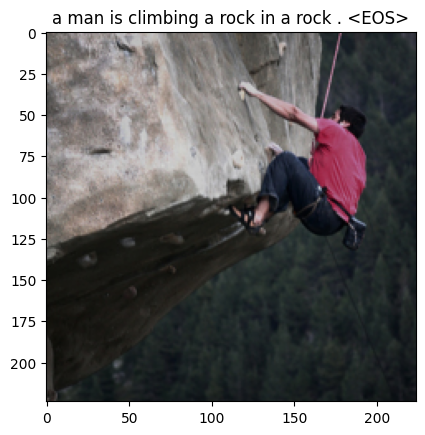

Label caption: a rock climber practices on a rock climbing wall .
Epoch: 2 loss: 2.89534


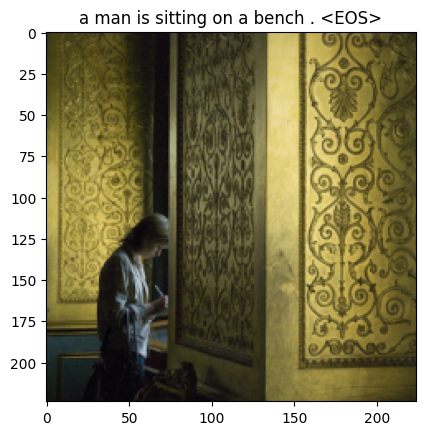

Label caption: woman writing on a pad in room with gold , decorated walls .
Epoch: 3 loss: 2.81304


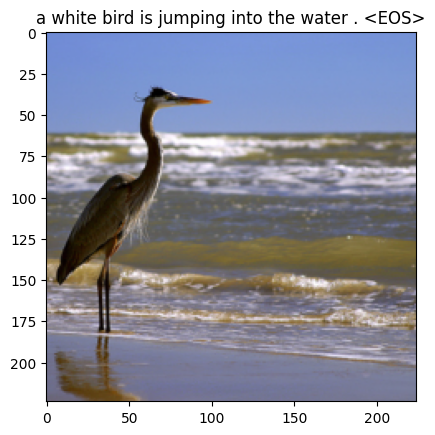

Label caption: a white crane stands tall as it looks out upon the ocean .
Epoch: 4 loss: 2.76131


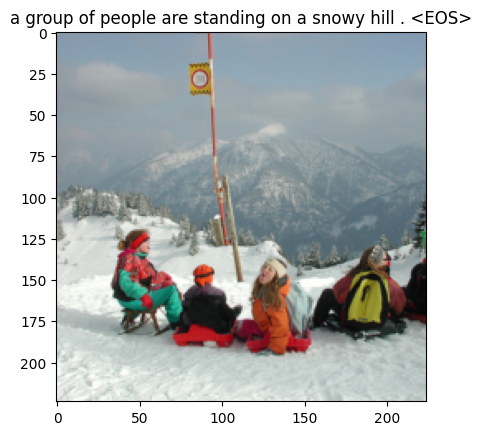

Label caption: five people are sitting together in the snow .
Epoch: 5 loss: 3.28543


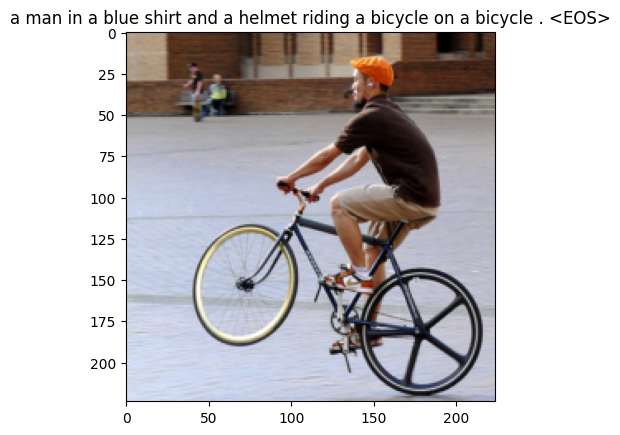

Label caption: man on a bicycle riding on only one wheel .
Epoch: 6 loss: 2.71842


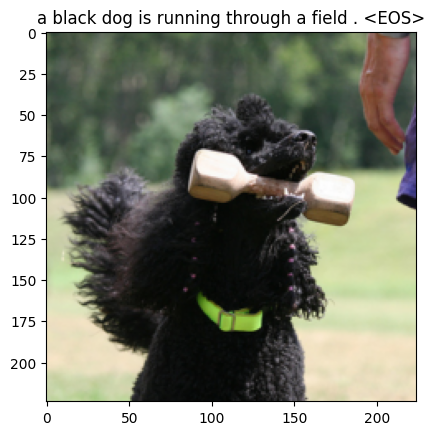

Label caption: the black dog has a toy in its mouth and a person stands nearby .
Epoch: 7 loss: 2.75679


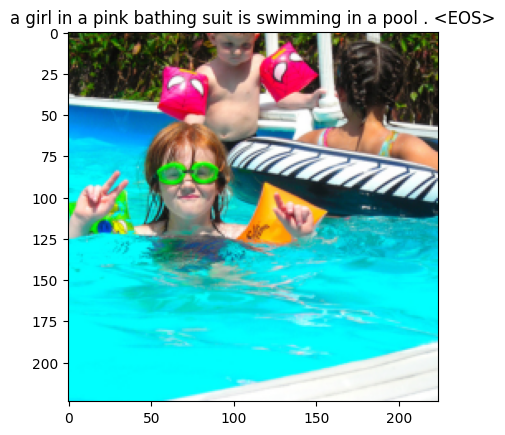

Label caption: a young girl with goggles and floaties poses for the camera as she plays in a pool .
Epoch: 8 loss: 2.63214


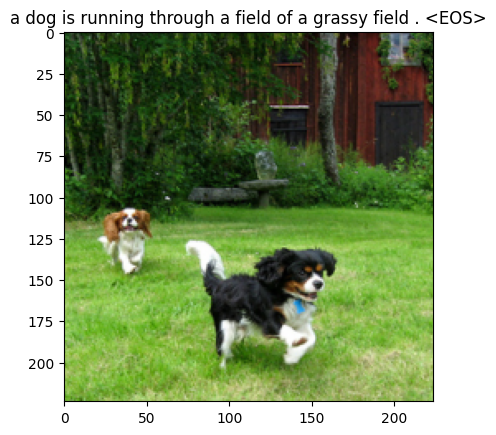

Label caption: two dogs are running through the grass near a house and trees .
Epoch: 9 loss: 2.23126


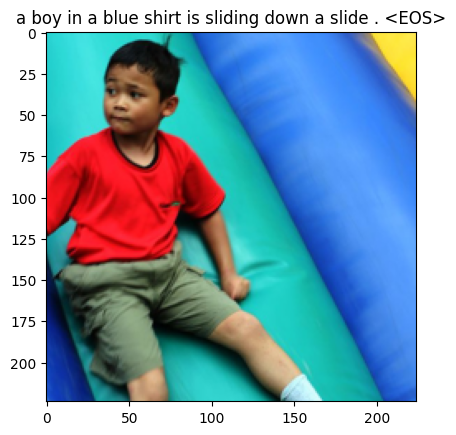

Label caption: a young boy sliding down an inflatable , is looking off camera .
Epoch: 10 loss: 2.34795


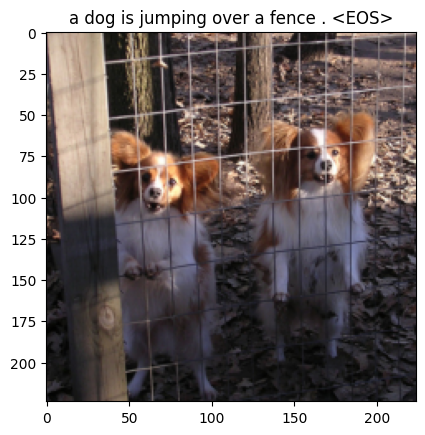

Label caption: two white and brown dogs up against a fence .
Epoch: 11 loss: 2.22876


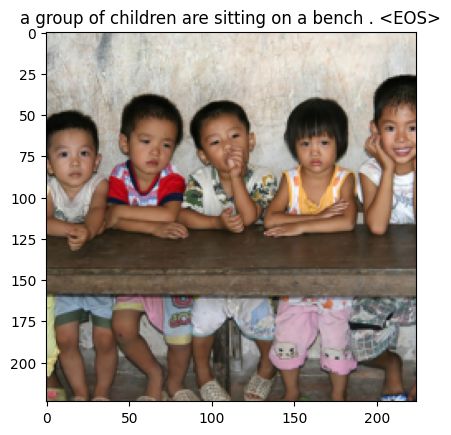

Label caption: six small children sitting at a desk .
Epoch: 12 loss: 2.56191


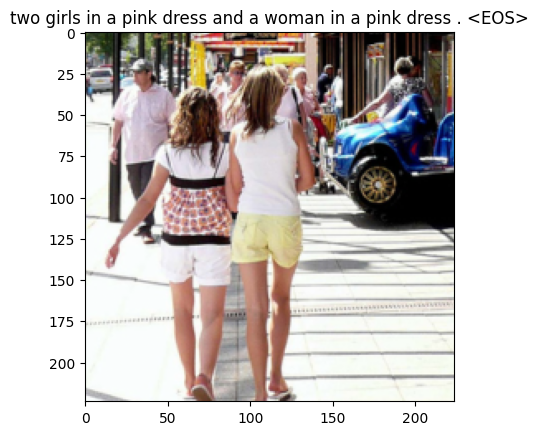

Label caption: two women walk on the sidewalk .
Epoch: 13 loss: 2.44448


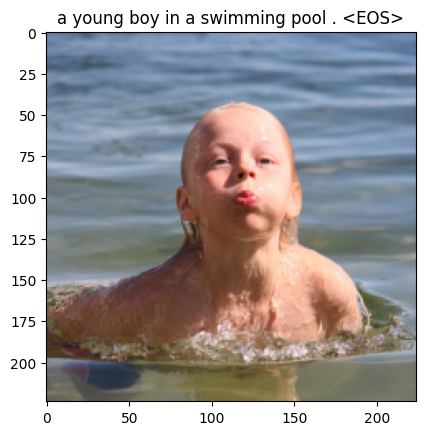

Label caption: the small child comes up from underwater .
Epoch: 14 loss: 2.24472


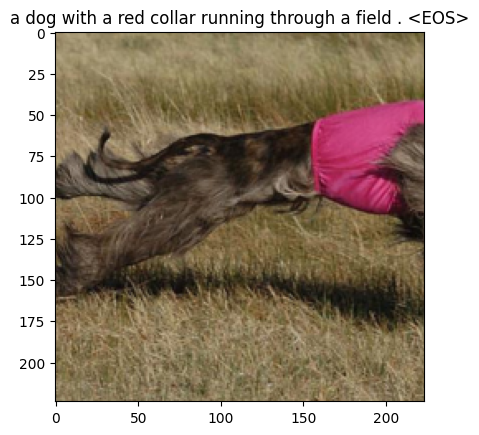

Label caption: dog with pink jacket running in field
Epoch: 15 loss: 1.90532


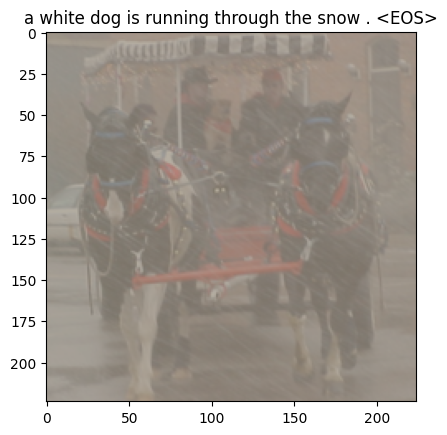

Label caption: the horses pull the carriage , holding people and a dog , through the rain .


In [46]:
num_epochs = 15
print_every = 100

test_iter = iter(test_loader)

for epoch in range(1,num_epochs+1):   
    for idx, (image, captions) in enumerate(iter(data_loader)):
        image,captions = image.to(device),captions.to(device)

        # Zero the gradients.
        optimizer.zero_grad()

        # Feed forward
        outputs,attentions = model(image, captions)

        # Calculate the batch loss.
        targets = captions[:,1:]
        loss = criterion(outputs.view(-1, vocab_size), targets.reshape(-1))
        
        # Backward pass.
        loss.backward()

        # Update the parameters in the optimizer.
        optimizer.step()

    print("Epoch: {} loss: {:.5f}".format(epoch,loss.item()))
            
            
    #generate the caption
    model.eval()
    with torch.no_grad():
        img, label_cap = next(test_iter)
        features = model.encoder(img[0:1].to(device))

        caps,alphas = model.decoder.generate_caption(features,vocab=dataset.vocab)
        caption = ' '.join(caps)
        show_image(img[0], title=caption)
        
        caption_label = [dataset.vocab.itos[token] for token in label_cap[0].tolist()]
        eos_index = caption_label.index('<EOS>')
        caption_label = caption_label[1:eos_index]
        caption_label = ' '.join(caption_label)
        print("Label caption:", caption_label)
                
    model.train()
        